In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [33]:
# MAHADEV
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torchvision import transforms
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import torchvision
import random

# =========================
# Config / Hyperparameters
# =========================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

root_dir = "/kaggle/input/audi-cars/Audi"  # change as needed
image_size = 64         # 64 or 128 (works either way)
batch_size = 32
num_workers = 2

# VAE hyperparams
latent_channels = 4     # channels in latent spatial map (e.g., (B,4,H/8,W/8))
vae_hidden = 128
vae_lr = 3e-4
vae_epochs = 100
kl_weight = 5e-4

# DDPM hyperparams
ddpm_epochs = 400
ddpm_lr = 2e-4
num_diffusion_steps = 100
beta_start = 1e-4
beta_end = 2e-3

# training helpers
# precompute_latents = False    # set True to pre-encode whole dataset to disk (faster DDPM training)
# latent_cache_dir = "./latent_cache"
sample_every = 10             # sample every N epochs (for both VAE and DDPM)
sample_grid_n = 4             # how many samples to show

vae_losses, ddpm_losses = [], []


# Seed reproducibility
torch.manual_seed(42)
random.seed(42)



# =========================
# Sampler (DDPM schedule)
# =========================
class Sampler:
    def __init__(self, num_training_steps=num_diffusion_steps, beta_start=beta_start, beta_end=beta_end, device=device):
        self.num_training_steps = num_training_steps
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.device = device

        self.beta_schedule = self.linear_beta_schedule().to(device)  # (T,)
        self.alpha = 1.0 - self.beta_schedule
        self.alpha_cumulative_prod = torch.cumprod(self.alpha, dim=0).to(device)

    def linear_beta_schedule(self):
        return torch.linspace(self.beta_start, self.beta_end, self.num_training_steps)

    def add_noise(self, inputs, timesteps):
        """
        inputs: (B, C, H, W)
        timesteps: (B,) long tensor in [0, T-1]
        returns noisy_images, noise
        """
        batch_size = inputs.shape[0]
        # alpha_cumprod at each selected timestep -> (B,)
        alpha_cumprod_t = self.alpha_cumulative_prod[timesteps].view(batch_size,1,1,1)
        mean_coeff = torch.sqrt(alpha_cumprod_t)
        var_coeff = torch.sqrt(1 - alpha_cumprod_t)
        noise = torch.randn_like(inputs)
        noisy = mean_coeff * inputs + var_coeff * noise
        return noisy, noise

    def remove_noise(self, x_t, t, pred_noise):
        """
        DDPM reverse step: compute x_{t-1} from x_t
        x_t: current noisy image (B,C,H,W)
        t: timestep tensor (B,) long
        pred_noise: predicted noise for x_t
        """
        batch = x_t.shape[0]
        beta_t = self.beta_schedule[t].view(batch,1,1,1)
        alpha_t = self.alpha[t].view(batch,1,1,1)
        alpha_cumprod_t = self.alpha_cumulative_prod[t].view(batch,1,1,1)
        alpha_cumprod_t_prev = self.alpha_cumulative_prod[(t-1).clamp(min=0)].view(batch,1,1,1)
    
        # predicted x0
        x0 = (x_t - torch.sqrt(1 - alpha_cumprod_t) * pred_noise) / torch.sqrt(alpha_cumprod_t)
    
        # DDPM posterior mean
        mean = (
            torch.sqrt(alpha_cumprod_t_prev) * beta_t / (1 - alpha_cumprod_t) * x0 +
            torch.sqrt(alpha_t) * (1 - alpha_cumprod_t_prev) / (1 - alpha_cumprod_t) * x_t
        )
    
        # variance
        var = (1 - alpha_cumprod_t_prev) / (1 - alpha_cumprod_t) * beta_t
        var = torch.clamp(var, min=1e-20)
    
        noise = torch.randn_like(x_t)
        nonzero_mask = (t > 0).float().view(batch,1,1,1)  # no noise when t==0
        return mean + nonzero_mask * torch.sqrt(var) * noise
    


sampler = Sampler()

Device: cuda


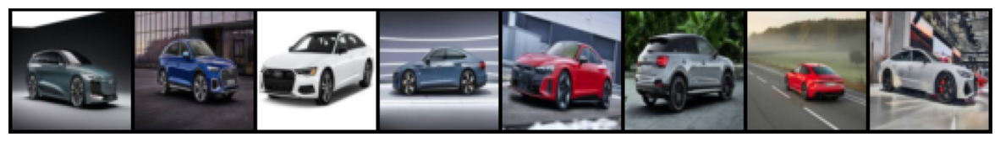

In [4]:
# ================
# Dataset utilities
# ================
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])
])

class ImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        for fname in os.listdir(root_dir):
            if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
                self.image_paths.append(os.path.join(root_dir, fname))
        self.image_paths.sort()
    def __len__(self):
        return len(self.image_paths)
    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img

dataset = ImageDataset(root_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)

# Get a batch of images
data_iter = iter(dataloader)
images = next(data_iter)

# Function to display images
def show_images(images, nrow=8):
    # Denormalize the images
    images = images * 0.5 + 0.5  # Reverse the normalization
    
    # Create grid
    grid = torchvision.utils.make_grid(images, nrow=nrow)
    
    # Convert to numpy and change dimensions for matplotlib
    grid = grid.permute(1, 2, 0).cpu().numpy()
    
    # Display
    plt.figure(figsize=(15, 15))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

# Display the batch
show_images(images[:8])

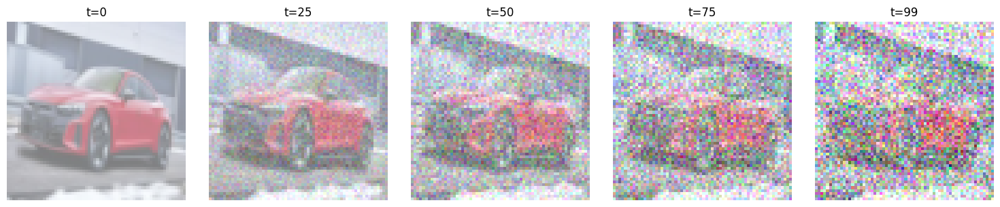

In [5]:
# rand=torch.randn(4,3,64,64)
# randtime=torch.randint(0,1000,(4,))
# sampler.add_noise(rand,randtime)

image = images[4]            # shape [C, H, W]
image = image * 0.5 + 0.5    # denormalize if in [-1,1]

# Convert from [C, H, W] -> [H, W, C]
img = image.permute(1, 2, 0).cpu().numpy()

# plt.imshow(img)
# plt.axis("off")
# plt.show()

original_image = image.to(device)

# Visualize forward diffusion at different timesteps
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
timesteps = [0, 25, 50, 75, 99]

for i, t in enumerate(timesteps):
    if t == 0:
        img = original_image
    else:
        timestep = torch.tensor([t]).to(device)
        img, _ = sampler.add_noise(original_image.unsqueeze(0), timestep)
        img = img[0]
    
    # Denormalize for display
    img_show = (img + 1) / 2
    img_show = img_show.cpu().clamp(0, 1).permute(1, 2, 0)
    
    axes[i].imshow(img_show)
    axes[i].set_title(f't={t}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [34]:
# ============================
# VAE: convolutional encoder/decoder producing spatial latents (B, z_channels, 8, 8) ---
# ============================
class ConvVAE(nn.Module):
    def __init__(self, img_channels=3, z_channels=4, hidden_channels=128):
        super().__init__()
        # Encoder: 64x64 -> 8x8 via 3 downsampling (stride=2)
        self.enc_conv1 = nn.Conv2d(img_channels, hidden_channels//2, 4, 2, 1)  # 64->32
        self.enc_conv2 = nn.Conv2d(hidden_channels//2, hidden_channels, 4, 2, 1) # 32->16
        self.enc_conv3 = nn.Conv2d(hidden_channels, hidden_channels, 4, 2, 1)   # 16->8

        # produce mu and logvar with z_channels feature maps (spatial)
        self.enc_mu = nn.Conv2d(hidden_channels, z_channels, 3, 1, 1)
        self.enc_logvar = nn.Conv2d(hidden_channels, z_channels, 3, 1, 1)

        # Decoder: 8x8 -> 64x64 via 3 upsampling convtranspose
        self.dec_conv1 = nn.ConvTranspose2d(z_channels, hidden_channels, 4, 2, 1)  # 8->16
        self.dec_conv2 = nn.ConvTranspose2d(hidden_channels, hidden_channels//2, 4, 2, 1)  #16->32
        self.dec_conv3 = nn.ConvTranspose2d(hidden_channels//2, img_channels, 4, 2, 1) #32->64

        # small MLP/conv nonlinearity
        self.act = nn.SiLU()

    def encode(self, x):
        x = self.act(self.enc_conv1(x))
        x = self.act(self.enc_conv2(x))
        x = self.act(self.enc_conv3(x))  # (B, hidden, 8, 8)
        mu = self.enc_mu(x)
        logvar = self.enc_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        # sample epsilon per element
        std = (0.5 * logvar).exp()
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        x = self.act(self.dec_conv1(z))
        x = self.act(self.dec_conv2(x))
        x = self.dec_conv3(x)
        # output to range [-1, 1] to match image normalization
        return torch.tanh(x)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar



# ============================
# SelfAttention
# ============================
class SelfAttention(nn.Module):

  def __init__(self, in_channels, num_heads=4, attn_p=0, proj_p=0, fused_attn=True):  # dropout = 0

    super().__init__()
    assert in_channels % num_heads == 0
    self.num_heads = num_heads
    self.head_dim = in_channels // num_heads
    self.scale = self.head_dim ** -0.5
    self.fused_attn = fused_attn

    self.qkv = nn.Linear(in_channels, in_channels*3)
    self.attn_p = attn_p
    self.attn_drop = nn.Dropout(attn_p)
    self.proj = nn.Linear(in_channels, in_channels)
    self.proj_drop = nn.Dropout(proj_p)

  def forward(self, x):
    batch_size, seq_len, embed_dim = x.shape

    qkv = self.qkv(x).reshape(batch_size, seq_len, 3, self.num_heads, self.head_dim)
    qkv = qkv.permute(2,0,3,1,4)
    q,k,v = qkv.unbind(0)

    if self.fused_attn:
      x = F.scaled_dot_product_attention(q,k,v, dropout_p=self.attn_p)
    else:
      attn = (q @ k.transpose(-2,-1)) * self.scale
      attn = attn.softmax(dim=-1)
      attn = self.attn_drop(attn)
      x = attn @ v

    x = x.transpose(1,2).reshape(batch_size, seq_len, embed_dim)
    x = self.proj(x)
    x = self.proj_drop(x)

    return x


# ============================
# SinusoidalTimeEmbedding
# ============================
class SinusoidalTimeEmbedding(nn.Module):
    def __init__(self, time_embed_dim, scaled_time_embed_dim):
        super().__init__()
        self.inv_freqs = nn.Parameter(1.0 / (10000**(torch.arange(0, time_embed_dim, 2).float() / (time_embed_dim/2))),
                                      requires_grad=False)

        # print(self.inv_freqs.shape,self.inv_freqs)
        self.time_mlp = nn.Sequential(nn.Linear(time_embed_dim, scaled_time_embed_dim),
                                      nn.SiLU(),
                                      nn.Linear(scaled_time_embed_dim, scaled_time_embed_dim),
                                      nn.SiLU())
    def forward(self, timesteps):
        # print(timesteps.shape)
        timestep_freqs = timesteps.unsqueeze(1) * self.inv_freqs.unsqueeze(0)
        # print(timesteps)

        embeddings = torch.cat([torch.sin(timestep_freqs), torch.cos(timestep_freqs)], axis=-1)
        embeddings = self.time_mlp(embeddings)
        return embeddings


# ============================
# ResidualBlock
# ============================
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, groupnorm_num_groups, time_embed_dim):
        super().__init__()

        self.time_expand = nn.Linear(time_embed_dim, out_channels)

        self.groupnorm1 = nn.GroupNorm(groupnorm_num_groups, in_channels)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding="same")

        self.groupnorm2 = nn.GroupNorm(groupnorm_num_groups, out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding="same")

        self.residual_connection = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, time_embeddings):

        residual_connection = x

        time_embed = self.time_expand(time_embeddings)

        x = self.groupnorm1(x)
        x = self.conv1(F.silu(x))
        x = x + time_embed.reshape((*time_embed.shape, 1, 1)) # Add Time Embeddings

        x = self.groupnorm2(x)
        x = self.conv2(F.silu(x))

        x = x + self.residual_connection(residual_connection) # Add Residual

        return x
        

# ============================
# AttentionBlock
# ============================
class AttentionBlock(nn.Module):
    def __init__(self, in_channels, num_heads=4, attn_p=0.0, proj_p=0.0):
        super().__init__()
        self.groupnorm = nn.GroupNorm(8, in_channels)
        self.attention = SelfAttention(in_channels, num_heads, attn_p, proj_p)

    def forward(self, x):
        batch_size, channels, height, width = x.shape
        residual = x

        # Normalize and reshape for attention
        x = self.groupnorm(x)
        x = x.view(batch_size, channels, height * width).permute(0, 2, 1)  # (B, H*W, C)

        # Apply attention
        x = self.attention(x)

        # Reshape back to spatial dimensions
        x = x.permute(0, 2, 1).view(batch_size, channels, height, width)

        # Residual connection
        return x + residual


# ================
# DownBlock
# ================
class DownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, groupnorm_num_groups, time_embed_dim,
                 num_heads=4, has_attention=True, downsample=True):
        super().__init__()
        self.has_attention = has_attention
        self.downsample = downsample

        # ResNet blocks
        self.resnet1 = ResidualBlock(in_channels, out_channels, groupnorm_num_groups, time_embed_dim)
        self.resnet2 = ResidualBlock(out_channels, out_channels, groupnorm_num_groups, time_embed_dim)

        # Attention block
        if has_attention:
            self.attention = AttentionBlock(out_channels, num_heads)

        # Downsampling
        if downsample:
            self.downsample_conv = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1)

    def forward(self, x, time_embeddings):
        # Apply ResNet blocks
        x = self.resnet1(x, time_embeddings)
        x = self.resnet2(x, time_embeddings)

        # Apply attention if specified
        if self.has_attention:
            x = self.attention(x)

        # Store skip connection before downsampling
        skip = x

        # Downsample if specified
        if self.downsample:
            x = self.downsample_conv(x)

        return x, skip

# ================
# UpBlock
# ================
class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, groupnorm_num_groups, time_embed_dim,
                 num_heads=4, has_attention=True, upsample=True):
        super().__init__()
        self.has_attention = has_attention
        self.upsample = upsample

        # Upsampling
        if upsample:
            self.upsample_conv = nn.ConvTranspose2d(in_channels, in_channels, kernel_size=4, stride=2, padding=1)

        # ResNet blocks (input channels doubled due to skip connection)
        self.resnet1 = ResidualBlock(in_channels + out_channels, out_channels, groupnorm_num_groups, time_embed_dim)
        self.resnet2 = ResidualBlock(out_channels, out_channels, groupnorm_num_groups, time_embed_dim)

        # Attention block
        if has_attention:
            self.attention = AttentionBlock(out_channels, num_heads)

    def forward(self, x, skip, time_embeddings):
        # Upsample if specified
        if self.upsample:
            x = self.upsample_conv(x)

        # Concatenate with skip connection
        x = torch.cat([x, skip], dim=1)

        # Apply ResNet blocks
        x = self.resnet1(x, time_embeddings)
        x = self.resnet2(x, time_embeddings)

        # Apply attention if specified
        if self.has_attention:
            x = self.attention(x)

        return x


# ================
# AttentionUNet
# ================
class AttentionUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, time_embed_dim=128, 
                 scaled_time_embed_dim=512, groupnorm_num_groups=8):
        super().__init__()
        
        # Time embedding
        self.time_embedding = SinusoidalTimeEmbedding(time_embed_dim, scaled_time_embed_dim)
        
        # Initial convolution
        self.initial_conv = nn.Conv2d(in_channels, 64, kernel_size=3, padding=1)
        
        # Encoder (Downsampling path)
        self.down1 = DownBlock(64, 128, groupnorm_num_groups, scaled_time_embed_dim, has_attention=False)
        self.down2 = DownBlock(128, 256, groupnorm_num_groups, scaled_time_embed_dim, has_attention=True)
        self.down3 = DownBlock(256, 512, groupnorm_num_groups, scaled_time_embed_dim, has_attention=True)
        
        # Bottleneck
        self.bottleneck = DownBlock(512, 512, groupnorm_num_groups, scaled_time_embed_dim, 
                                   has_attention=True, downsample=False)
        
        # Decoder (Upsampling path)
        self.up1 = UpBlock(512, 512, groupnorm_num_groups, scaled_time_embed_dim, has_attention=True)
        self.up2 = UpBlock(512, 256, groupnorm_num_groups, scaled_time_embed_dim, has_attention=True)
        self.up3 = UpBlock(256, 128, groupnorm_num_groups, scaled_time_embed_dim, has_attention=False)
        
        # Final layers
        self.final_resnet = ResidualBlock(128, 64, groupnorm_num_groups, scaled_time_embed_dim)
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=3, padding=1)
        
    def forward(self, x, timesteps):
        # Get time embeddings
        time_embeddings = self.time_embedding(timesteps)
        
        # Initial convolution
        x = self.initial_conv(x)
        
        # Encoder path with skip connections
        x, skip1 = self.down1(x, time_embeddings)  # 64x64 -> 32x32
        x, skip2 = self.down2(x, time_embeddings)  # 32x32 -> 16x16  
        x, skip3 = self.down3(x, time_embeddings)  # 16x16 -> 8x8
        
        # Bottleneck
        x, _ = self.bottleneck(x, time_embeddings)  # 8x8
        
        # Decoder path with skip connections
        x = self.up1(x, skip3, time_embeddings)  # 8x8 -> 16x16
        x = self.up2(x, skip2, time_embeddings)  # 16x16 -> 32x32
        x = self.up3(x, skip1, time_embeddings)  # 32x32 -> 64x64
        
        # Final processing
        x = self.final_resnet(x, time_embeddings)
        x = self.final_conv(x)
        
        return x

# Instantiate models
vae = ConvVAE(img_channels=3, z_channels=latent_channels, hidden_channels=vae_hidden).to(device)
model = AttentionUNet(in_channels=latent_channels, out_channels=latent_channels).to(device)


# Print parameter counts
print(f"VAE params: {sum(p.numel() for p in vae.parameters())/1e6:.3f}M")
print(f"UNet params: {sum(p.numel() for p in model.parameters())/1e6:.3f}M")



VAE params: 0.548M
UNet params: 56.536M


In [41]:
# # Test the model
# def test_model():
#     model.eval()
#     with torch.no_grad():
#         # Get a batch from dataloader
#         test_batch = next(iter(dataloader))
#         test_images = test_batch.to(device)
        
#         # Add noise
#         timesteps = torch.randint(0, 100, (test_images.shape[0],)).to(device)
#         noisy_images, noise = sampler.add_noise(test_images, timesteps)
        
#         # Predict noise
#         predicted_noise = model(noisy_images, timesteps)
        
#         print(f"Input shape: {test_images.shape}")
#         print(f"Noisy images shape: {noisy_images.shape}")
#         print(f"Predicted noise shape: {predicted_noise.shape}")
#         print(f"Actual noise shape: {noise.shape}")
#         print("Model test passed!")

# # Test the model
# test_model()



In [32]:
del vae
del model
# del optimizer
torch.cuda.empty_cache()

In [25]:
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear)):
        nn.init.kaiming_normal_(m.weight, a=0, mode='fan_in', nonlinearity='relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)

vae.apply(init_weights)
model.apply(init_weights)

In [35]:
# ==========
# Utilities
# ==========
def vae_loss(recon, x, mu, logvar, kl_w=kl_weight):
    recon_loss = F.mse_loss(recon, x, reduction='mean')
    kl = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kl_w * kl, recon_loss, kl

def visualize_images(tensor_imgs, title="samples", nrow=4):
    # tensor_imgs in [0,1]
    grid = torchvision.utils.make_grid(tensor_imgs, nrow=nrow, padding=2)
    np_img = grid.permute(1,2,0).cpu().numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np_img)
    plt.axis('off')
    plt.title(title)
    plt.show()



# =====================
# Training: VAE (stage 1)
# =====================
def train_vae(vae, dataloader, epochs=vae_epochs, lr=vae_lr, kl_w=kl_weight, sample_every=sample_every):
    opt = optim.AdamW(vae.parameters(), lr=lr)
    vae.train()
    for epoch in range(epochs):
        total_loss = 0.0
        total_recon = 0.0
        total_kl = 0.0
        pbar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"VAE Epoch {epoch+1}/{epochs}", leave=False)
        for i, batch in pbar:
            x = batch.to(device)
            opt.zero_grad()
            recon, mu, logvar = vae(x)
            loss, recon_l, kl_l = vae_loss(recon, x, mu, logvar, kl_w)
            loss.backward()
            opt.step()

            total_loss += loss.item()
            total_recon += recon_l.item()
            total_kl += kl_l.item()
            pbar.set_postfix({'loss': f'{loss.item():.4f}', 'recon': f'{recon_l:.4f}', 'kl': f'{kl_l:.4f}'})
        print(f"[VAE] Epoch {epoch+1} avg loss {total_loss/len(dataloader):.4f} recon {total_recon/len(dataloader)/1:.4f} kl {total_kl/len(dataloader):.4f}")

        # inside train_vae loop (after each epoch):
        vae_losses.append(total_loss / len(dataloader))

        if (epoch+1) % sample_every == 0:
            # show reconstructions from a small batch
            vae.eval()
            with torch.no_grad():
                sample_batch = next(iter(dataloader))[:sample_grid_n].to(device)
                recon, mu, logvar = vae(sample_batch)
                # to [0,1] for display
                orig = (sample_batch + 1) / 2
                rec = (recon + 1) / 2
                visualize_images(torch.cat([orig, rec], dim=0), title=f"VAE Reconstructions epoch {epoch+1}", nrow=sample_grid_n)
            vae.train()
    # Save final VAE
    torch.save(vae.state_dict(), "vae_final.pt")
    print("Saved vae_final.pt")

# =====================================
# Training: DDPM in latent space (stage 2)
# =====================================
def encode_batch_to_latents(vae, batch):
    with torch.no_grad():
        mu, logvar = vae.encode(batch)
        z = vae.reparameterize(mu, logvar)
    return z

def train_ddpm(vae, model, sampler, dataloader, epochs=ddpm_epochs, lr=ddpm_lr, sample_every=sample_every):
    # Freeze VAE
    vae.eval()
    for p in vae.parameters():
        p.requires_grad = False

    ddpm_loader = dataloader
    
    optimizer = optim.AdamW(model.parameters(), lr=lr, betas=(0.9,0.999), weight_decay=0.0)
    mse = nn.MSELoss()
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=len(dataloader)*epochs)

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0
        pbar = tqdm(enumerate(ddpm_loader), total=len(ddpm_loader), desc=f"DDPM Epoch {epoch+1}/{epochs}", leave=False)
        for i, batch in pbar:
            imgs = batch.to(device)
            latents = encode_batch_to_latents(vae, imgs)  # shape (B, latent_channels, hz, wz)

            bs = latents.shape[0]
            timesteps = torch.randint(0, sampler.num_training_steps, (bs,), device=device).long()
            noisy_latents, noise = sampler.add_noise(latents, timesteps)

            optimizer.zero_grad()
            pred_noise = model(noisy_latents, timesteps)
            loss = mse(pred_noise, noise)
            loss.backward()
            
            # Gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            
            optimizer.step()
            scheduler.step()

            epoch_loss += loss.item()
            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

        print(f"[DDPM] Epoch {epoch+1} avg loss: {epoch_loss/len(ddpm_loader):.4f}")

        # inside train_ddpm loop (after each epoch):
        ddpm_losses.append(epoch_loss / len(ddpm_loader))

        if (epoch+1) % sample_every == 0 or epoch == epochs-1:
            sample_latents_and_decode(vae, model, sampler, num_samples=sample_grid_n, show_title=f"DDPM samples epoch {epoch+1}")

    torch.save(model.state_dict(), "ddpm_model_final.pt")
    print("Saved ddpm_model_final.pt")


# ========================
# Sampling (latent -> decode)
# ========================
@torch.no_grad()
def sample_latents_and_decode(vae, model, sampler, num_samples=4, sample_steps=50, show_title="Samples"):
    model.eval()
    vae.eval()
    # spatial size of latent depends on input image resolution and VAE architecture.
    # For our VAE: image_size // 8 => latent spatial size
    latent_h = image_size // 8
    latent_w = image_size // 8

    # Start from pure Gaussian noise in latent space
    samples = torch.randn(num_samples, latent_channels, latent_h, latent_w, device=device)

    # timesteps list (we can use fewer steps at inference, but here 50)
    t_seq = torch.linspace(sampler.num_training_steps-1, 0, sample_steps).long().to(device)

    for i, t in enumerate(t_seq):
        t_batched = torch.full((num_samples,), t.item(), device=device, dtype=torch.long)
        pred_noise = model(samples, t_batched)
        samples = sampler.remove_noise(samples, t_batched, pred_noise)

    # After loop, decode latents to image space
    decoded = vae.decode(samples).clamp(-1,1)
    imgs = (decoded + 1) / 2.0  # to [0,1]
    visualize_images(imgs, title=show_title, nrow=num_samples)



Starting VAE training...


[VAE] Epoch 1 avg loss 0.2525 recon 0.2489 kl 7.1540


[VAE] Epoch 2 avg loss 0.1330 recon 0.1290 kl 7.8750


[VAE] Epoch 3 avg loss 0.1005 recon 0.0977 kl 5.5531


[VAE] Epoch 4 avg loss 0.0837 recon 0.0809 kl 5.6406


[VAE] Epoch 5 avg loss 0.0747 recon 0.0721 kl 5.3690


[VAE] Epoch 6 avg loss 0.0691 recon 0.0666 kl 5.0995


[VAE] Epoch 7 avg loss 0.0652 recon 0.0627 kl 5.0046


[VAE] Epoch 8 avg loss 0.0617 recon 0.0592 kl 5.0017


[VAE] Epoch 9 avg loss 0.0581 recon 0.0556 kl 5.0351


[VAE] Epoch 10 avg loss 0.0553 recon 0.0529 kl 4.9150


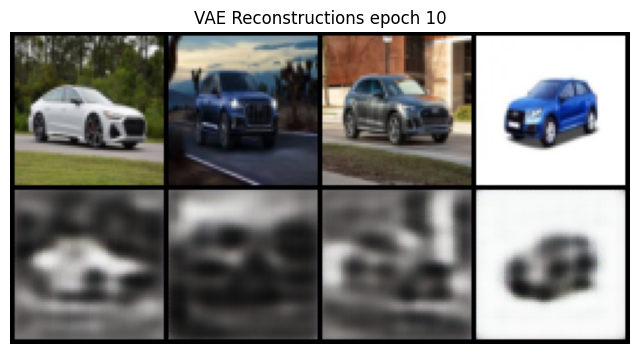

[VAE] Epoch 11 avg loss 0.0535 recon 0.0512 kl 4.6851


[VAE] Epoch 12 avg loss 0.0523 recon 0.0501 kl 4.5434


[VAE] Epoch 13 avg loss 0.0508 recon 0.0486 kl 4.4109


[VAE] Epoch 14 avg loss 0.0495 recon 0.0473 kl 4.2762


[VAE] Epoch 15 avg loss 0.0481 recon 0.0460 kl 4.0961


[VAE] Epoch 16 avg loss 0.0457 recon 0.0436 kl 4.1257


[VAE] Epoch 17 avg loss 0.0415 recon 0.0394 kl 4.1661


[VAE] Epoch 18 avg loss 0.0397 recon 0.0377 kl 3.9978


[VAE] Epoch 19 avg loss 0.0379 recon 0.0359 kl 3.9485


[VAE] Epoch 20 avg loss 0.0366 recon 0.0347 kl 3.8637


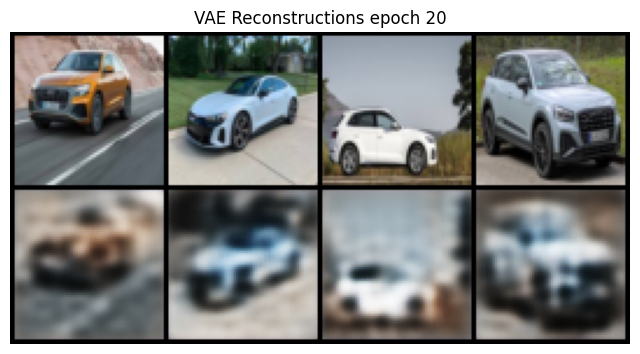

[VAE] Epoch 21 avg loss 0.0358 recon 0.0339 kl 3.8075


[VAE] Epoch 22 avg loss 0.0352 recon 0.0332 kl 3.9804


[VAE] Epoch 23 avg loss 0.0345 recon 0.0326 kl 3.7040


[VAE] Epoch 24 avg loss 0.0340 recon 0.0322 kl 3.6498


[VAE] Epoch 25 avg loss 0.0337 recon 0.0318 kl 3.6775


[VAE] Epoch 26 avg loss 0.0331 recon 0.0313 kl 3.6809


[VAE] Epoch 27 avg loss 0.0326 recon 0.0309 kl 3.5567


[VAE] Epoch 28 avg loss 0.0322 recon 0.0304 kl 3.5673


[VAE] Epoch 29 avg loss 0.0318 recon 0.0300 kl 3.5471


[VAE] Epoch 30 avg loss 0.0319 recon 0.0302 kl 3.5062


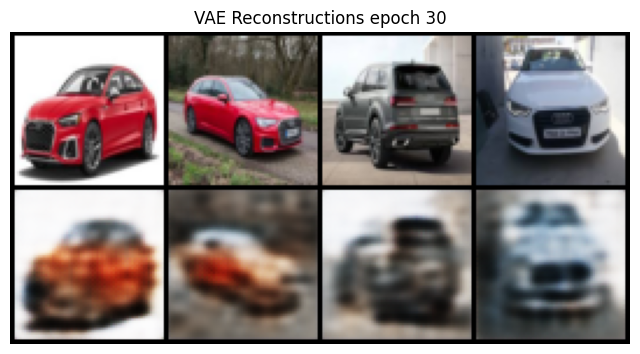

[VAE] Epoch 31 avg loss 0.0316 recon 0.0299 kl 3.4812


[VAE] Epoch 32 avg loss 0.0313 recon 0.0296 kl 3.4742


[VAE] Epoch 33 avg loss 0.0310 recon 0.0293 kl 3.4488


[VAE] Epoch 34 avg loss 0.0311 recon 0.0294 kl 3.4291


[VAE] Epoch 35 avg loss 0.0308 recon 0.0291 kl 3.4096


[VAE] Epoch 36 avg loss 0.0307 recon 0.0290 kl 3.3981


[VAE] Epoch 37 avg loss 0.0308 recon 0.0291 kl 3.3969


[VAE] Epoch 38 avg loss 0.0304 recon 0.0288 kl 3.3828


[VAE] Epoch 39 avg loss 0.0304 recon 0.0287 kl 3.3574


[VAE] Epoch 40 avg loss 0.0303 recon 0.0287 kl 3.3354


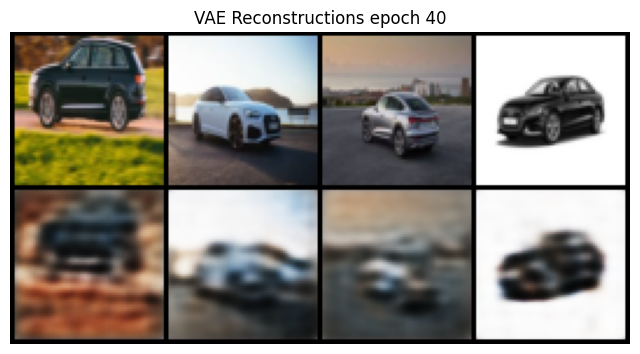

[VAE] Epoch 41 avg loss 0.0302 recon 0.0286 kl 3.3225


[VAE] Epoch 42 avg loss 0.0302 recon 0.0285 kl 3.3408


[VAE] Epoch 43 avg loss 0.0301 recon 0.0284 kl 3.3065


[VAE] Epoch 44 avg loss 0.0299 recon 0.0282 kl 3.2932


[VAE] Epoch 45 avg loss 0.0300 recon 0.0284 kl 3.2884


[VAE] Epoch 46 avg loss 0.0297 recon 0.0281 kl 3.2844


[VAE] Epoch 47 avg loss 0.0296 recon 0.0280 kl 3.2669


[VAE] Epoch 48 avg loss 0.0296 recon 0.0280 kl 3.2583


[VAE] Epoch 49 avg loss 0.0295 recon 0.0278 kl 3.2479


[VAE] Epoch 50 avg loss 0.0295 recon 0.0279 kl 3.2358


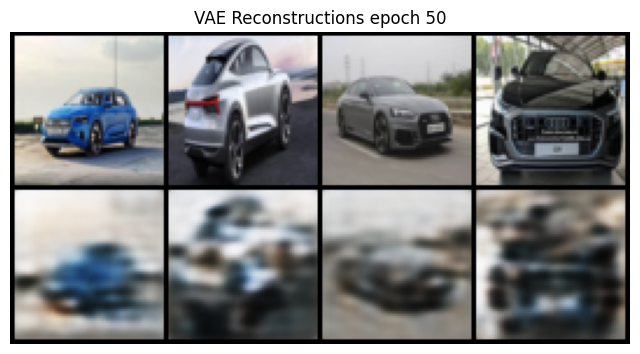

[VAE] Epoch 51 avg loss 0.0295 recon 0.0278 kl 3.2297


[VAE] Epoch 52 avg loss 0.0294 recon 0.0278 kl 3.2189


[VAE] Epoch 53 avg loss 0.0294 recon 0.0278 kl 3.2236


[VAE] Epoch 54 avg loss 0.0292 recon 0.0276 kl 3.2258


[VAE] Epoch 55 avg loss 0.0293 recon 0.0277 kl 3.2095


[VAE] Epoch 56 avg loss 0.0291 recon 0.0275 kl 3.2051


[VAE] Epoch 57 avg loss 0.0291 recon 0.0275 kl 3.1929


[VAE] Epoch 58 avg loss 0.0291 recon 0.0275 kl 3.2042


[VAE] Epoch 59 avg loss 0.0290 recon 0.0274 kl 3.1822


[VAE] Epoch 60 avg loss 0.0291 recon 0.0275 kl 3.1937


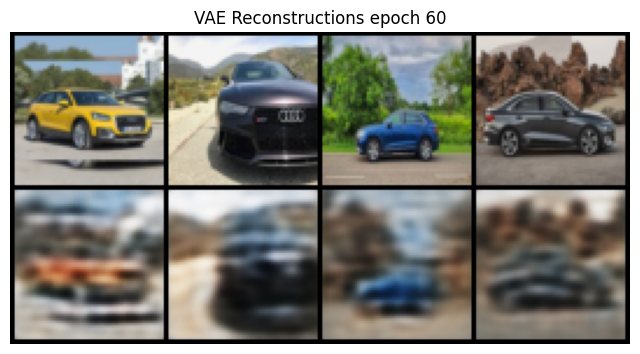

[VAE] Epoch 61 avg loss 0.0289 recon 0.0273 kl 3.1774


[VAE] Epoch 62 avg loss 0.0289 recon 0.0273 kl 3.1833


[VAE] Epoch 63 avg loss 0.0289 recon 0.0273 kl 3.1853


[VAE] Epoch 64 avg loss 0.0287 recon 0.0271 kl 3.1733


[VAE] Epoch 65 avg loss 0.0288 recon 0.0272 kl 3.1773


[VAE] Epoch 66 avg loss 0.0287 recon 0.0271 kl 3.1667


[VAE] Epoch 67 avg loss 0.0288 recon 0.0272 kl 3.1674


[VAE] Epoch 68 avg loss 0.0286 recon 0.0270 kl 3.1620


[VAE] Epoch 69 avg loss 0.0286 recon 0.0270 kl 3.1616


[VAE] Epoch 70 avg loss 0.0288 recon 0.0272 kl 3.1623


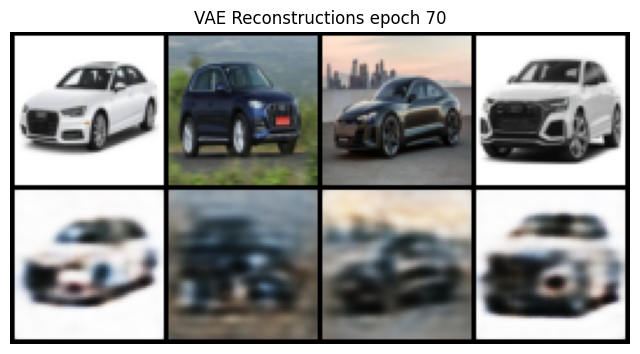

[VAE] Epoch 71 avg loss 0.0285 recon 0.0269 kl 3.1554


[VAE] Epoch 72 avg loss 0.0287 recon 0.0271 kl 3.1702


[VAE] Epoch 73 avg loss 0.0286 recon 0.0270 kl 3.1541


[VAE] Epoch 74 avg loss 0.0284 recon 0.0268 kl 3.1622


[VAE] Epoch 75 avg loss 0.0284 recon 0.0268 kl 3.1560


[VAE] Epoch 76 avg loss 0.0285 recon 0.0269 kl 3.1473


[VAE] Epoch 77 avg loss 0.0285 recon 0.0269 kl 3.1579


[VAE] Epoch 78 avg loss 0.0284 recon 0.0268 kl 3.1646


[VAE] Epoch 79 avg loss 0.0283 recon 0.0267 kl 3.1492


[VAE] Epoch 80 avg loss 0.0283 recon 0.0267 kl 3.1558


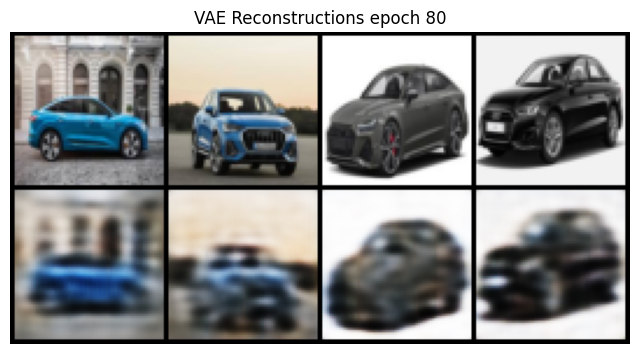

[VAE] Epoch 81 avg loss 0.0282 recon 0.0266 kl 3.1537


[VAE] Epoch 82 avg loss 0.0284 recon 0.0268 kl 3.1555


[VAE] Epoch 83 avg loss 0.0282 recon 0.0266 kl 3.1494


[VAE] Epoch 84 avg loss 0.0283 recon 0.0267 kl 3.1459


[VAE] Epoch 85 avg loss 0.0282 recon 0.0266 kl 3.1511


[VAE] Epoch 86 avg loss 0.0282 recon 0.0266 kl 3.1504


[VAE] Epoch 87 avg loss 0.0281 recon 0.0265 kl 3.1545


[VAE] Epoch 88 avg loss 0.0281 recon 0.0265 kl 3.1530


[VAE] Epoch 89 avg loss 0.0280 recon 0.0265 kl 3.1510


[VAE] Epoch 90 avg loss 0.0280 recon 0.0265 kl 3.1421


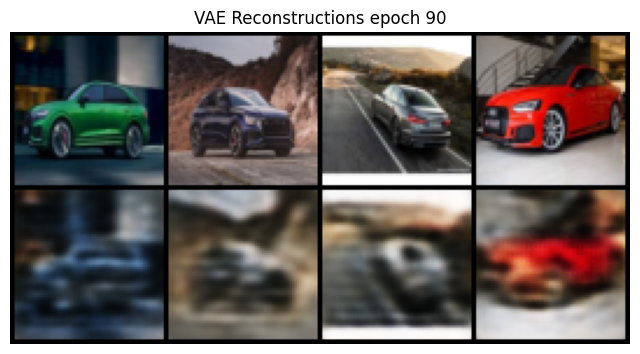

[VAE] Epoch 91 avg loss 0.0281 recon 0.0265 kl 3.1466


[VAE] Epoch 92 avg loss 0.0280 recon 0.0264 kl 3.1499


[VAE] Epoch 93 avg loss 0.0280 recon 0.0264 kl 3.1523


[VAE] Epoch 94 avg loss 0.0280 recon 0.0264 kl 3.1414


[VAE] Epoch 95 avg loss 0.0280 recon 0.0264 kl 3.1448


[VAE] Epoch 96 avg loss 0.0279 recon 0.0263 kl 3.1418


[VAE] Epoch 97 avg loss 0.0278 recon 0.0262 kl 3.1424


[VAE] Epoch 98 avg loss 0.0279 recon 0.0263 kl 3.1502


[VAE] Epoch 99 avg loss 0.0278 recon 0.0263 kl 3.1288


[VAE] Epoch 100 avg loss 0.0280 recon 0.0264 kl 3.1398


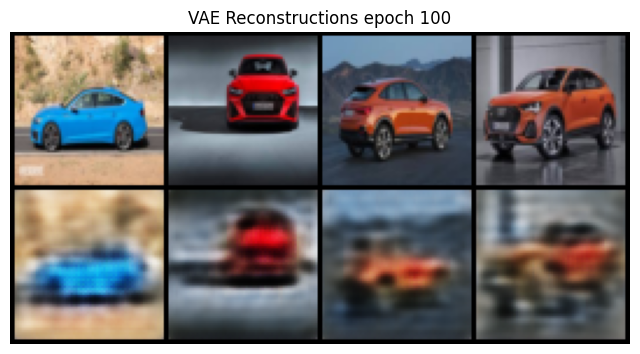

Saved vae_final.pt


In [36]:
# 1) Train VAE first
print("Starting VAE training...")
train_vae(vae, dataloader, epochs=vae_epochs, lr=vae_lr, kl_w=kl_weight, sample_every=sample_every)

Starting DDPM (latent-space) training...


[DDPM] Epoch 1 avg loss: 1.0225


[DDPM] Epoch 2 avg loss: 0.9824


[DDPM] Epoch 3 avg loss: 0.9729


[DDPM] Epoch 4 avg loss: 0.9586


[DDPM] Epoch 5 avg loss: 0.9575


[DDPM] Epoch 6 avg loss: 0.9498


[DDPM] Epoch 7 avg loss: 0.9415


[DDPM] Epoch 8 avg loss: 0.9436


[DDPM] Epoch 9 avg loss: 0.9279


[DDPM] Epoch 10 avg loss: 0.9242


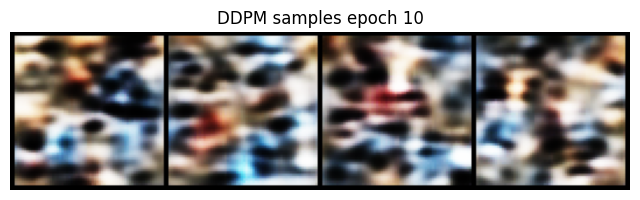

[DDPM] Epoch 11 avg loss: 0.9170


[DDPM] Epoch 12 avg loss: 0.9127


[DDPM] Epoch 13 avg loss: 0.9120


[DDPM] Epoch 14 avg loss: 0.9057


[DDPM] Epoch 15 avg loss: 0.8997


[DDPM] Epoch 16 avg loss: 0.9038


[DDPM] Epoch 17 avg loss: 0.8901


[DDPM] Epoch 18 avg loss: 0.8912


[DDPM] Epoch 19 avg loss: 0.8950


[DDPM] Epoch 20 avg loss: 0.8879


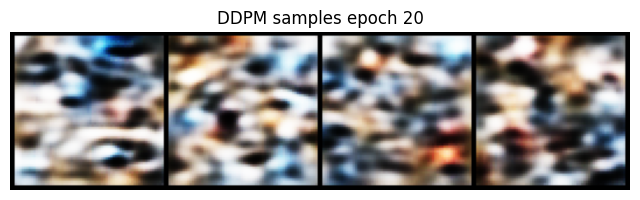

[DDPM] Epoch 21 avg loss: 0.8892


[DDPM] Epoch 22 avg loss: 0.8817


[DDPM] Epoch 23 avg loss: 0.8844


[DDPM] Epoch 24 avg loss: 0.8893


[DDPM] Epoch 25 avg loss: 0.8744


[DDPM] Epoch 26 avg loss: 0.8789


[DDPM] Epoch 27 avg loss: 0.8762


[DDPM] Epoch 28 avg loss: 0.8694


[DDPM] Epoch 29 avg loss: 0.8701


[DDPM] Epoch 30 avg loss: 0.8681


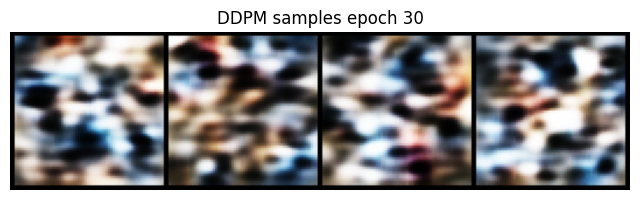

[DDPM] Epoch 31 avg loss: 0.8663


[DDPM] Epoch 32 avg loss: 0.8637


[DDPM] Epoch 33 avg loss: 0.8629


[DDPM] Epoch 34 avg loss: 0.8667


[DDPM] Epoch 35 avg loss: 0.8702


[DDPM] Epoch 36 avg loss: 0.8632


[DDPM] Epoch 37 avg loss: 0.8595


[DDPM] Epoch 38 avg loss: 0.8575


[DDPM] Epoch 39 avg loss: 0.8590


[DDPM] Epoch 40 avg loss: 0.8512


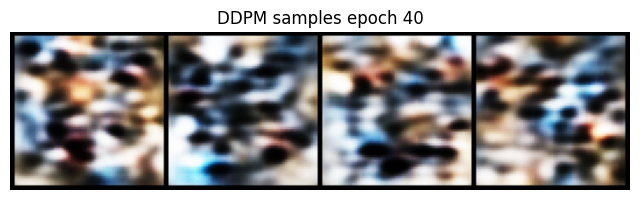

[DDPM] Epoch 41 avg loss: 0.8434


[DDPM] Epoch 42 avg loss: 0.8541


[DDPM] Epoch 43 avg loss: 0.8466


[DDPM] Epoch 44 avg loss: 0.8472


[DDPM] Epoch 45 avg loss: 0.8437


[DDPM] Epoch 46 avg loss: 0.8463


[DDPM] Epoch 47 avg loss: 0.8414


[DDPM] Epoch 48 avg loss: 0.8374


[DDPM] Epoch 49 avg loss: 0.8403


[DDPM] Epoch 50 avg loss: 0.8387


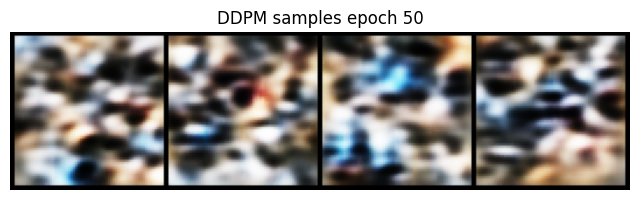

[DDPM] Epoch 51 avg loss: 0.8378


[DDPM] Epoch 52 avg loss: 0.8346


[DDPM] Epoch 53 avg loss: 0.8349


[DDPM] Epoch 54 avg loss: 0.8331


[DDPM] Epoch 55 avg loss: 0.8293


[DDPM] Epoch 56 avg loss: 0.8288


[DDPM] Epoch 57 avg loss: 0.8296


[DDPM] Epoch 58 avg loss: 0.8249


[DDPM] Epoch 59 avg loss: 0.8296


[DDPM] Epoch 60 avg loss: 0.8222


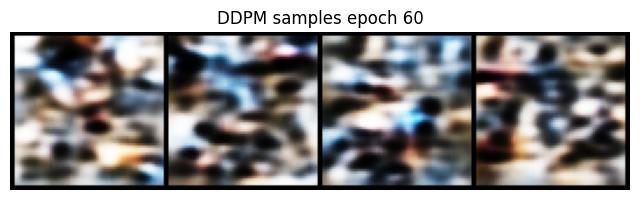

[DDPM] Epoch 61 avg loss: 0.8217


[DDPM] Epoch 62 avg loss: 0.8166


[DDPM] Epoch 63 avg loss: 0.8210


[DDPM] Epoch 64 avg loss: 0.8191


[DDPM] Epoch 65 avg loss: 0.8134


[DDPM] Epoch 66 avg loss: 0.8156


[DDPM] Epoch 67 avg loss: 0.8033


[DDPM] Epoch 68 avg loss: 0.8014


[DDPM] Epoch 69 avg loss: 0.8027


[DDPM] Epoch 70 avg loss: 0.7987


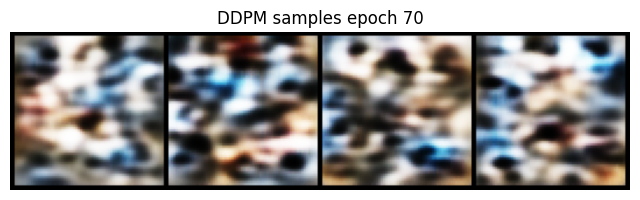

[DDPM] Epoch 71 avg loss: 0.8043


[DDPM] Epoch 72 avg loss: 0.7920


[DDPM] Epoch 73 avg loss: 0.7921


[DDPM] Epoch 74 avg loss: 0.7970


[DDPM] Epoch 75 avg loss: 0.7893


[DDPM] Epoch 76 avg loss: 0.8004


[DDPM] Epoch 77 avg loss: 0.7904


[DDPM] Epoch 78 avg loss: 0.7933


[DDPM] Epoch 79 avg loss: 0.7826


[DDPM] Epoch 80 avg loss: 0.7864


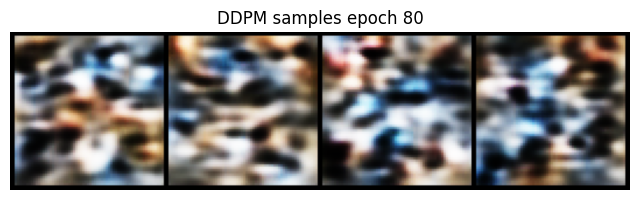

[DDPM] Epoch 81 avg loss: 0.7867


[DDPM] Epoch 82 avg loss: 0.7782


[DDPM] Epoch 83 avg loss: 0.7792


[DDPM] Epoch 84 avg loss: 0.7865


[DDPM] Epoch 85 avg loss: 0.7695


[DDPM] Epoch 86 avg loss: 0.7709


[DDPM] Epoch 87 avg loss: 0.7687


[DDPM] Epoch 88 avg loss: 0.7649


[DDPM] Epoch 89 avg loss: 0.7623


[DDPM] Epoch 90 avg loss: 0.7652


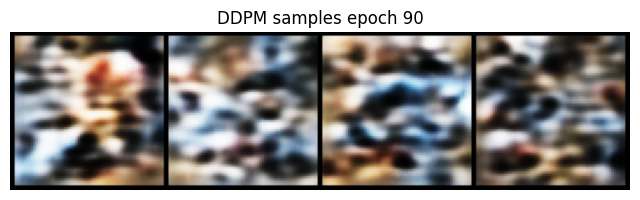

[DDPM] Epoch 91 avg loss: 0.7670


[DDPM] Epoch 92 avg loss: 0.7574


[DDPM] Epoch 93 avg loss: 0.7605


[DDPM] Epoch 94 avg loss: 0.7505


[DDPM] Epoch 95 avg loss: 0.7550


[DDPM] Epoch 96 avg loss: 0.7565


[DDPM] Epoch 97 avg loss: 0.7433


[DDPM] Epoch 98 avg loss: 0.7395


[DDPM] Epoch 99 avg loss: 0.7426


[DDPM] Epoch 100 avg loss: 0.7342


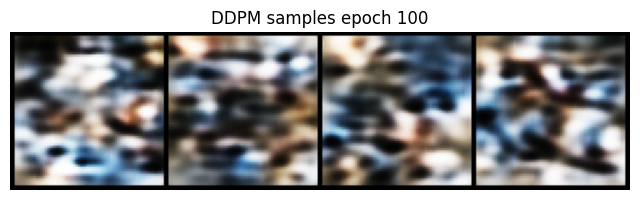

[DDPM] Epoch 101 avg loss: 0.7412


[DDPM] Epoch 102 avg loss: 0.7386


[DDPM] Epoch 103 avg loss: 0.7351


[DDPM] Epoch 104 avg loss: 0.7349


[DDPM] Epoch 105 avg loss: 0.7308


[DDPM] Epoch 106 avg loss: 0.7250


[DDPM] Epoch 107 avg loss: 0.7265


[DDPM] Epoch 108 avg loss: 0.7177


[DDPM] Epoch 109 avg loss: 0.7132


[DDPM] Epoch 110 avg loss: 0.7224


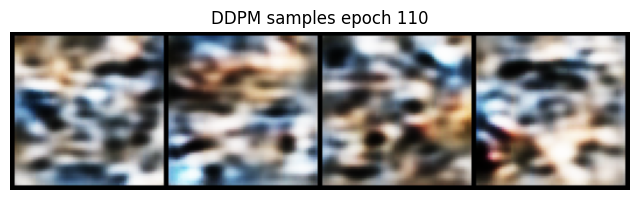

[DDPM] Epoch 111 avg loss: 0.7171


[DDPM] Epoch 112 avg loss: 0.7087


[DDPM] Epoch 113 avg loss: 0.7151


[DDPM] Epoch 114 avg loss: 0.7057


[DDPM] Epoch 115 avg loss: 0.7137


[DDPM] Epoch 116 avg loss: 0.7108


[DDPM] Epoch 117 avg loss: 0.6970


[DDPM] Epoch 118 avg loss: 0.7047


[DDPM] Epoch 119 avg loss: 0.7044


[DDPM] Epoch 120 avg loss: 0.7011


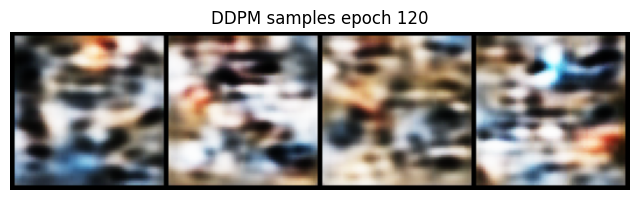

[DDPM] Epoch 121 avg loss: 0.6914


[DDPM] Epoch 122 avg loss: 0.6901


[DDPM] Epoch 123 avg loss: 0.6970


[DDPM] Epoch 124 avg loss: 0.6927


[DDPM] Epoch 125 avg loss: 0.6939


[DDPM] Epoch 126 avg loss: 0.6770


[DDPM] Epoch 127 avg loss: 0.6860


[DDPM] Epoch 128 avg loss: 0.6757


[DDPM] Epoch 129 avg loss: 0.6727


[DDPM] Epoch 130 avg loss: 0.6722


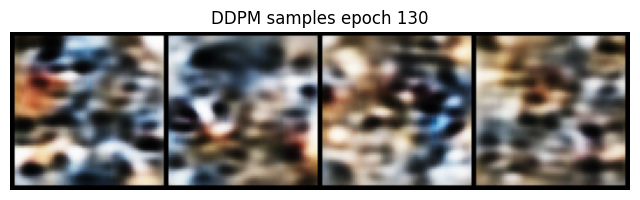

[DDPM] Epoch 131 avg loss: 0.6694


[DDPM] Epoch 132 avg loss: 0.6816


[DDPM] Epoch 133 avg loss: 0.6709


[DDPM] Epoch 134 avg loss: 0.6667


[DDPM] Epoch 135 avg loss: 0.6555


[DDPM] Epoch 136 avg loss: 0.6605


[DDPM] Epoch 137 avg loss: 0.6626


[DDPM] Epoch 138 avg loss: 0.6503


[DDPM] Epoch 139 avg loss: 0.6663


[DDPM] Epoch 140 avg loss: 0.6568


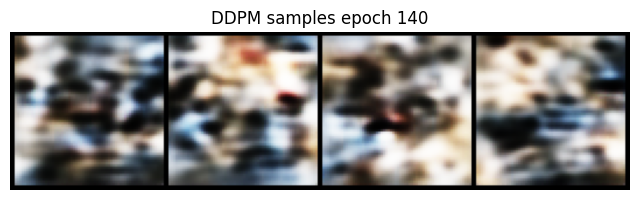

[DDPM] Epoch 141 avg loss: 0.6545


[DDPM] Epoch 142 avg loss: 0.6534


[DDPM] Epoch 143 avg loss: 0.6564


[DDPM] Epoch 144 avg loss: 0.6505


[DDPM] Epoch 145 avg loss: 0.6536


[DDPM] Epoch 146 avg loss: 0.6457


[DDPM] Epoch 147 avg loss: 0.6423


[DDPM] Epoch 148 avg loss: 0.6345


[DDPM] Epoch 149 avg loss: 0.6387


[DDPM] Epoch 150 avg loss: 0.6363


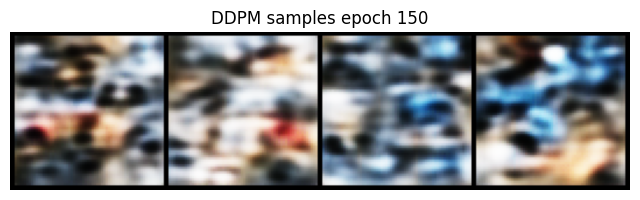

[DDPM] Epoch 151 avg loss: 0.6425


[DDPM] Epoch 152 avg loss: 0.6254


[DDPM] Epoch 153 avg loss: 0.6336


[DDPM] Epoch 154 avg loss: 0.6404


[DDPM] Epoch 155 avg loss: 0.6401


[DDPM] Epoch 156 avg loss: 0.6252


[DDPM] Epoch 157 avg loss: 0.6285


[DDPM] Epoch 158 avg loss: 0.6236


[DDPM] Epoch 159 avg loss: 0.6192


[DDPM] Epoch 160 avg loss: 0.6106


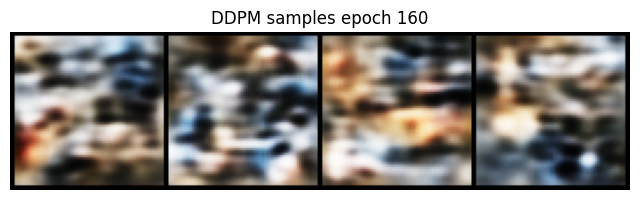

[DDPM] Epoch 161 avg loss: 0.6136


[DDPM] Epoch 162 avg loss: 0.6296


[DDPM] Epoch 163 avg loss: 0.6129


[DDPM] Epoch 164 avg loss: 0.5917


[DDPM] Epoch 165 avg loss: 0.6063


[DDPM] Epoch 166 avg loss: 0.6192


[DDPM] Epoch 167 avg loss: 0.6076


[DDPM] Epoch 168 avg loss: 0.6103


[DDPM] Epoch 169 avg loss: 0.6019


[DDPM] Epoch 170 avg loss: 0.6063


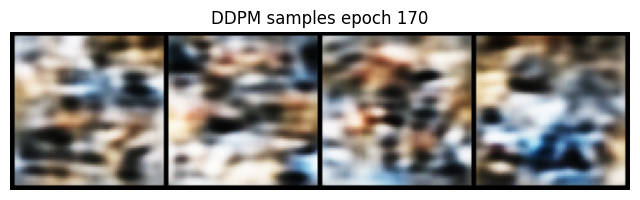

[DDPM] Epoch 171 avg loss: 0.6048


[DDPM] Epoch 172 avg loss: 0.5872


[DDPM] Epoch 173 avg loss: 0.5970


[DDPM] Epoch 174 avg loss: 0.5908


[DDPM] Epoch 175 avg loss: 0.5924


[DDPM] Epoch 176 avg loss: 0.5887


[DDPM] Epoch 177 avg loss: 0.5999


[DDPM] Epoch 178 avg loss: 0.5848


[DDPM] Epoch 179 avg loss: 0.5870


[DDPM] Epoch 180 avg loss: 0.5811


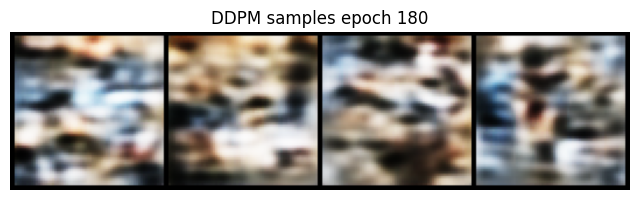

[DDPM] Epoch 181 avg loss: 0.5739


[DDPM] Epoch 182 avg loss: 0.5838


[DDPM] Epoch 183 avg loss: 0.5741


[DDPM] Epoch 184 avg loss: 0.5697


[DDPM] Epoch 185 avg loss: 0.5843


[DDPM] Epoch 186 avg loss: 0.5857


[DDPM] Epoch 187 avg loss: 0.5695


[DDPM] Epoch 188 avg loss: 0.5647


[DDPM] Epoch 189 avg loss: 0.5678


[DDPM] Epoch 190 avg loss: 0.5703


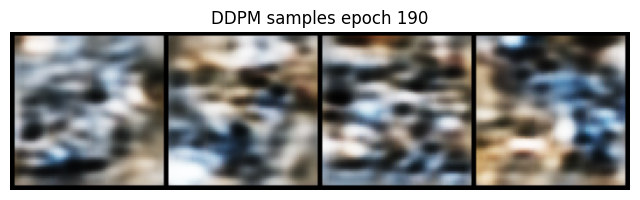

[DDPM] Epoch 191 avg loss: 0.5576


[DDPM] Epoch 192 avg loss: 0.5531


[DDPM] Epoch 193 avg loss: 0.5653


[DDPM] Epoch 194 avg loss: 0.5514


[DDPM] Epoch 195 avg loss: 0.5660


[DDPM] Epoch 196 avg loss: 0.5548


[DDPM] Epoch 197 avg loss: 0.5573


[DDPM] Epoch 198 avg loss: 0.5405


[DDPM] Epoch 199 avg loss: 0.5611


[DDPM] Epoch 200 avg loss: 0.5618


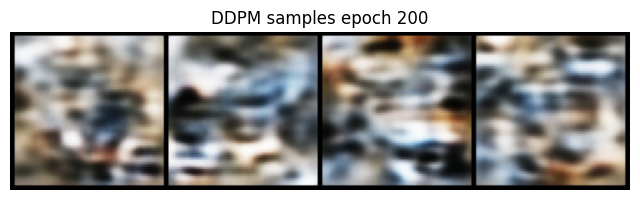

[DDPM] Epoch 201 avg loss: 0.5312


[DDPM] Epoch 202 avg loss: 0.5497


[DDPM] Epoch 203 avg loss: 0.5434


[DDPM] Epoch 204 avg loss: 0.5599


[DDPM] Epoch 205 avg loss: 0.5574


[DDPM] Epoch 206 avg loss: 0.5365


[DDPM] Epoch 207 avg loss: 0.5429


[DDPM] Epoch 208 avg loss: 0.5320


[DDPM] Epoch 209 avg loss: 0.5432


[DDPM] Epoch 210 avg loss: 0.5324


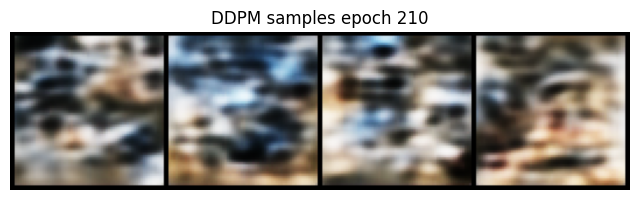

[DDPM] Epoch 211 avg loss: 0.5346


[DDPM] Epoch 212 avg loss: 0.5450


[DDPM] Epoch 213 avg loss: 0.5529


[DDPM] Epoch 214 avg loss: 0.5236


[DDPM] Epoch 215 avg loss: 0.5497


[DDPM] Epoch 216 avg loss: 0.5253


[DDPM] Epoch 217 avg loss: 0.5263


[DDPM] Epoch 218 avg loss: 0.5263


[DDPM] Epoch 219 avg loss: 0.5311


[DDPM] Epoch 220 avg loss: 0.5381


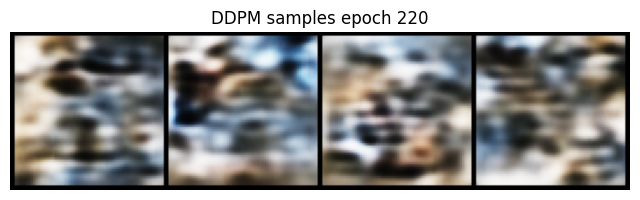

[DDPM] Epoch 221 avg loss: 0.5276


[DDPM] Epoch 222 avg loss: 0.5256


[DDPM] Epoch 223 avg loss: 0.5143


[DDPM] Epoch 224 avg loss: 0.5201


[DDPM] Epoch 225 avg loss: 0.5158


[DDPM] Epoch 226 avg loss: 0.5100


[DDPM] Epoch 227 avg loss: 0.5265


[DDPM] Epoch 228 avg loss: 0.5157


[DDPM] Epoch 229 avg loss: 0.5208


[DDPM] Epoch 230 avg loss: 0.5173


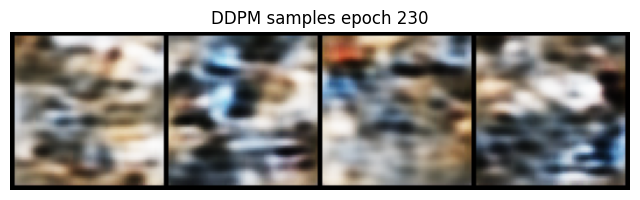

[DDPM] Epoch 231 avg loss: 0.5183


[DDPM] Epoch 232 avg loss: 0.5046


[DDPM] Epoch 233 avg loss: 0.5011


[DDPM] Epoch 234 avg loss: 0.5087


[DDPM] Epoch 235 avg loss: 0.5116


[DDPM] Epoch 236 avg loss: 0.5079


[DDPM] Epoch 237 avg loss: 0.4996


[DDPM] Epoch 238 avg loss: 0.4915


[DDPM] Epoch 239 avg loss: 0.4966


[DDPM] Epoch 240 avg loss: 0.4965


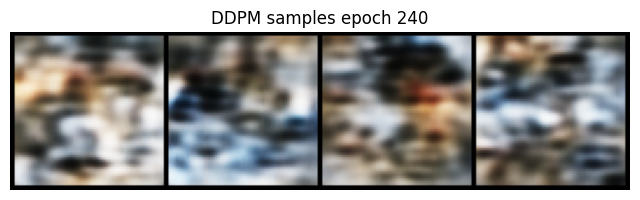

[DDPM] Epoch 241 avg loss: 0.5069


[DDPM] Epoch 242 avg loss: 0.4977


[DDPM] Epoch 243 avg loss: 0.5038


[DDPM] Epoch 244 avg loss: 0.4943


[DDPM] Epoch 245 avg loss: 0.4993


[DDPM] Epoch 246 avg loss: 0.4841


[DDPM] Epoch 247 avg loss: 0.4882


[DDPM] Epoch 248 avg loss: 0.4875


[DDPM] Epoch 249 avg loss: 0.4861


[DDPM] Epoch 250 avg loss: 0.4829


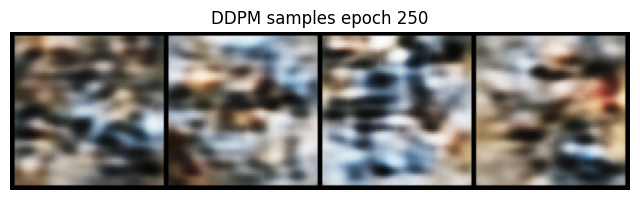

[DDPM] Epoch 251 avg loss: 0.4912


[DDPM] Epoch 252 avg loss: 0.4913


[DDPM] Epoch 253 avg loss: 0.4891


[DDPM] Epoch 254 avg loss: 0.4759


[DDPM] Epoch 255 avg loss: 0.4951


[DDPM] Epoch 256 avg loss: 0.4845


[DDPM] Epoch 257 avg loss: 0.4769


[DDPM] Epoch 258 avg loss: 0.4829


[DDPM] Epoch 259 avg loss: 0.4813


[DDPM] Epoch 260 avg loss: 0.4781


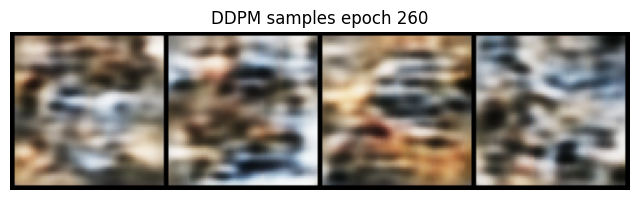

[DDPM] Epoch 261 avg loss: 0.4810


[DDPM] Epoch 262 avg loss: 0.4655


[DDPM] Epoch 263 avg loss: 0.4709


[DDPM] Epoch 264 avg loss: 0.4841


[DDPM] Epoch 265 avg loss: 0.4768


[DDPM] Epoch 266 avg loss: 0.4769


[DDPM] Epoch 267 avg loss: 0.4768


[DDPM] Epoch 268 avg loss: 0.4781


[DDPM] Epoch 269 avg loss: 0.4702


[DDPM] Epoch 270 avg loss: 0.4595


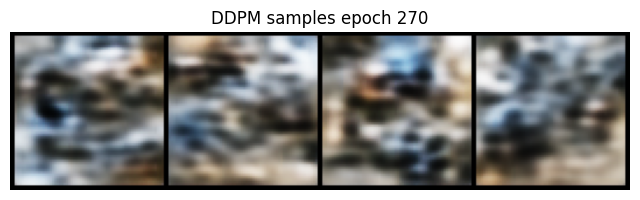

[DDPM] Epoch 271 avg loss: 0.4648


[DDPM] Epoch 272 avg loss: 0.4657


[DDPM] Epoch 273 avg loss: 0.4777


[DDPM] Epoch 274 avg loss: 0.4584


[DDPM] Epoch 275 avg loss: 0.4823


[DDPM] Epoch 276 avg loss: 0.4727


[DDPM] Epoch 277 avg loss: 0.4484


[DDPM] Epoch 278 avg loss: 0.4657


[DDPM] Epoch 279 avg loss: 0.4756


[DDPM] Epoch 280 avg loss: 0.4571


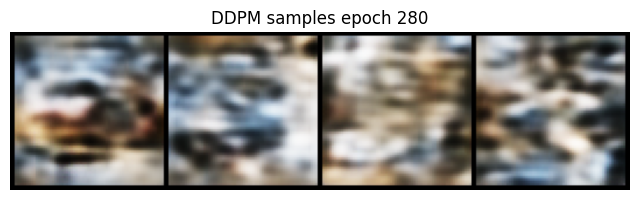

[DDPM] Epoch 281 avg loss: 0.4563


[DDPM] Epoch 282 avg loss: 0.4485


[DDPM] Epoch 283 avg loss: 0.4603


[DDPM] Epoch 284 avg loss: 0.4485


[DDPM] Epoch 285 avg loss: 0.4537


[DDPM] Epoch 286 avg loss: 0.4546


[DDPM] Epoch 287 avg loss: 0.4590


[DDPM] Epoch 288 avg loss: 0.4642


[DDPM] Epoch 289 avg loss: 0.4579


[DDPM] Epoch 290 avg loss: 0.4625


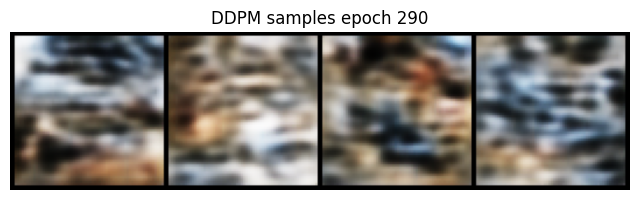

[DDPM] Epoch 291 avg loss: 0.4528


[DDPM] Epoch 292 avg loss: 0.4482


[DDPM] Epoch 293 avg loss: 0.4470


[DDPM] Epoch 294 avg loss: 0.4440


[DDPM] Epoch 295 avg loss: 0.4492


[DDPM] Epoch 296 avg loss: 0.4517


[DDPM] Epoch 297 avg loss: 0.4566


[DDPM] Epoch 298 avg loss: 0.4588


[DDPM] Epoch 299 avg loss: 0.4458


[DDPM] Epoch 300 avg loss: 0.4511


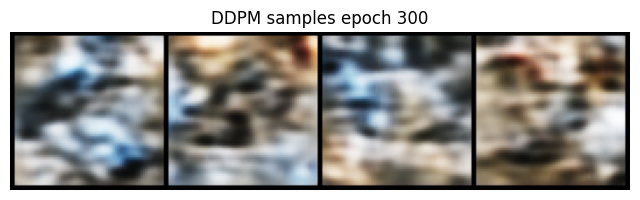

[DDPM] Epoch 301 avg loss: 0.4398


[DDPM] Epoch 302 avg loss: 0.4529


[DDPM] Epoch 303 avg loss: 0.4362


[DDPM] Epoch 304 avg loss: 0.4414


[DDPM] Epoch 305 avg loss: 0.4399


[DDPM] Epoch 306 avg loss: 0.4309


[DDPM] Epoch 307 avg loss: 0.4456


[DDPM] Epoch 308 avg loss: 0.4410


[DDPM] Epoch 309 avg loss: 0.4411


[DDPM] Epoch 310 avg loss: 0.4447


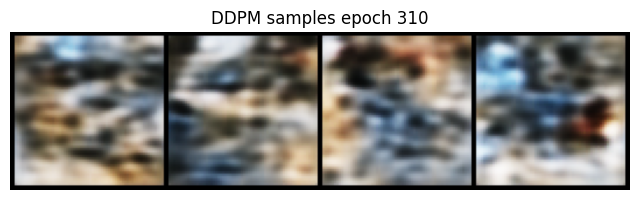

[DDPM] Epoch 311 avg loss: 0.4418


[DDPM] Epoch 312 avg loss: 0.4429


[DDPM] Epoch 313 avg loss: 0.4284


[DDPM] Epoch 314 avg loss: 0.4268


[DDPM] Epoch 315 avg loss: 0.4342


[DDPM] Epoch 316 avg loss: 0.4392


[DDPM] Epoch 317 avg loss: 0.4279


[DDPM] Epoch 318 avg loss: 0.4308


[DDPM] Epoch 319 avg loss: 0.4255


[DDPM] Epoch 320 avg loss: 0.4371


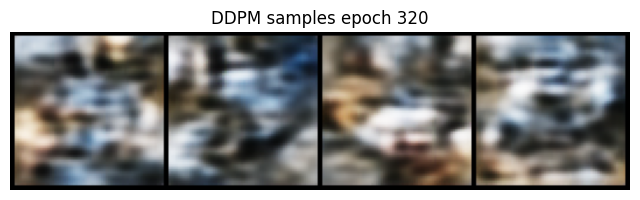

[DDPM] Epoch 321 avg loss: 0.4314


[DDPM] Epoch 322 avg loss: 0.4213


[DDPM] Epoch 323 avg loss: 0.4255


[DDPM] Epoch 324 avg loss: 0.4286


[DDPM] Epoch 325 avg loss: 0.4337


[DDPM] Epoch 326 avg loss: 0.4287


[DDPM] Epoch 327 avg loss: 0.4235


[DDPM] Epoch 328 avg loss: 0.4396


[DDPM] Epoch 329 avg loss: 0.4278


[DDPM] Epoch 330 avg loss: 0.4243


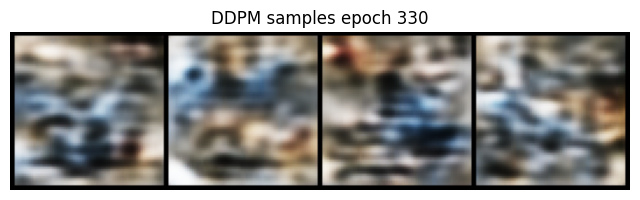

[DDPM] Epoch 331 avg loss: 0.4188


[DDPM] Epoch 332 avg loss: 0.4245


[DDPM] Epoch 333 avg loss: 0.4221


[DDPM] Epoch 334 avg loss: 0.4260


[DDPM] Epoch 335 avg loss: 0.4082


[DDPM] Epoch 336 avg loss: 0.4184


[DDPM] Epoch 337 avg loss: 0.4280


[DDPM] Epoch 338 avg loss: 0.4171


[DDPM] Epoch 339 avg loss: 0.4177


[DDPM] Epoch 340 avg loss: 0.4134


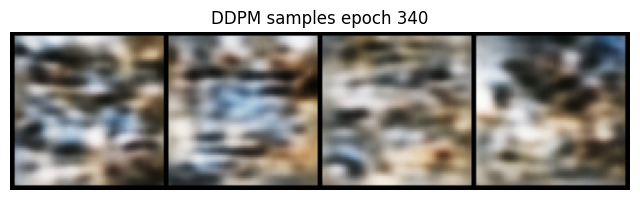

[DDPM] Epoch 341 avg loss: 0.4309


[DDPM] Epoch 342 avg loss: 0.4260


[DDPM] Epoch 343 avg loss: 0.4238


[DDPM] Epoch 344 avg loss: 0.4142


[DDPM] Epoch 345 avg loss: 0.4247


[DDPM] Epoch 346 avg loss: 0.4314


[DDPM] Epoch 347 avg loss: 0.4296


[DDPM] Epoch 348 avg loss: 0.4183


[DDPM] Epoch 349 avg loss: 0.4178


[DDPM] Epoch 350 avg loss: 0.4216


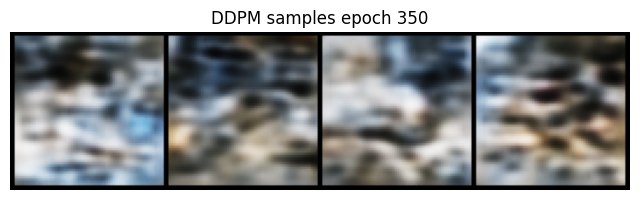

[DDPM] Epoch 351 avg loss: 0.4218


[DDPM] Epoch 352 avg loss: 0.4156


[DDPM] Epoch 353 avg loss: 0.4225


[DDPM] Epoch 354 avg loss: 0.4097


[DDPM] Epoch 355 avg loss: 0.4235


[DDPM] Epoch 356 avg loss: 0.4245


[DDPM] Epoch 357 avg loss: 0.4230


[DDPM] Epoch 358 avg loss: 0.4119


[DDPM] Epoch 359 avg loss: 0.4162


[DDPM] Epoch 360 avg loss: 0.4108


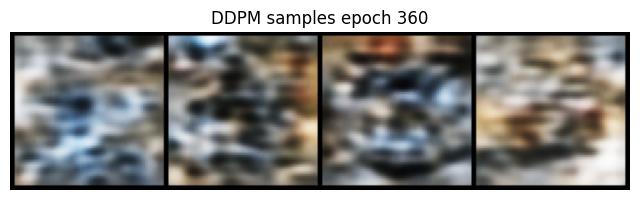

[DDPM] Epoch 361 avg loss: 0.4126


[DDPM] Epoch 362 avg loss: 0.4153


[DDPM] Epoch 363 avg loss: 0.4163


[DDPM] Epoch 364 avg loss: 0.3985


[DDPM] Epoch 365 avg loss: 0.4040


[DDPM] Epoch 366 avg loss: 0.4209


[DDPM] Epoch 367 avg loss: 0.4216


[DDPM] Epoch 368 avg loss: 0.4109


[DDPM] Epoch 369 avg loss: 0.4098


[DDPM] Epoch 370 avg loss: 0.4082


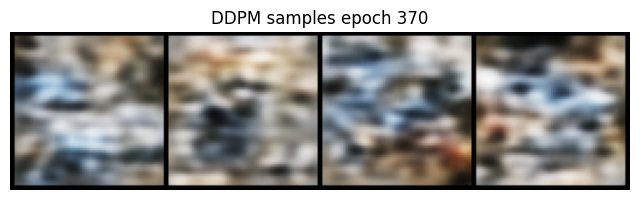

[DDPM] Epoch 371 avg loss: 0.4139


[DDPM] Epoch 372 avg loss: 0.4256


[DDPM] Epoch 373 avg loss: 0.4146


[DDPM] Epoch 374 avg loss: 0.4011


[DDPM] Epoch 375 avg loss: 0.4149


[DDPM] Epoch 376 avg loss: 0.4174


[DDPM] Epoch 377 avg loss: 0.4092


[DDPM] Epoch 378 avg loss: 0.4054


[DDPM] Epoch 379 avg loss: 0.4131


[DDPM] Epoch 380 avg loss: 0.4094


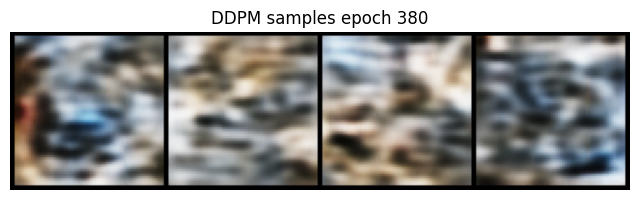

[DDPM] Epoch 381 avg loss: 0.4059


[DDPM] Epoch 382 avg loss: 0.4159


[DDPM] Epoch 383 avg loss: 0.4074


[DDPM] Epoch 384 avg loss: 0.4144


[DDPM] Epoch 385 avg loss: 0.4118


[DDPM] Epoch 386 avg loss: 0.4005


[DDPM] Epoch 387 avg loss: 0.4044


[DDPM] Epoch 388 avg loss: 0.4132


[DDPM] Epoch 389 avg loss: 0.4138


[DDPM] Epoch 390 avg loss: 0.4159


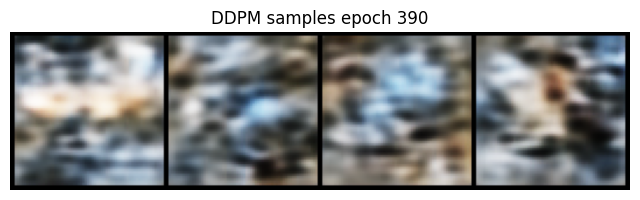

[DDPM] Epoch 391 avg loss: 0.4201


[DDPM] Epoch 392 avg loss: 0.4060


[DDPM] Epoch 393 avg loss: 0.4102


[DDPM] Epoch 394 avg loss: 0.4182


[DDPM] Epoch 395 avg loss: 0.4152


[DDPM] Epoch 396 avg loss: 0.4098


[DDPM] Epoch 397 avg loss: 0.4122


[DDPM] Epoch 398 avg loss: 0.4221


[DDPM] Epoch 399 avg loss: 0.4208


[DDPM] Epoch 400 avg loss: 0.4268


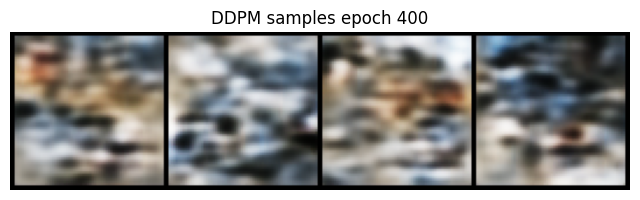

Saved ddpm_model_final.pt


In [37]:
# # optionally precompute latents now (faster DDPM training)
# if precompute_latents:
#     print("Precomputing latents after VAE training...")
#     precompute_and_save_latents(vae, dataloader, cache_dir=latent_cache_dir)


# 2) Train DDPM in latent space
print("Starting DDPM (latent-space) training...")
train_ddpm(vae, model, sampler, dataloader, epochs=ddpm_epochs, lr=ddpm_lr, sample_every=sample_every)



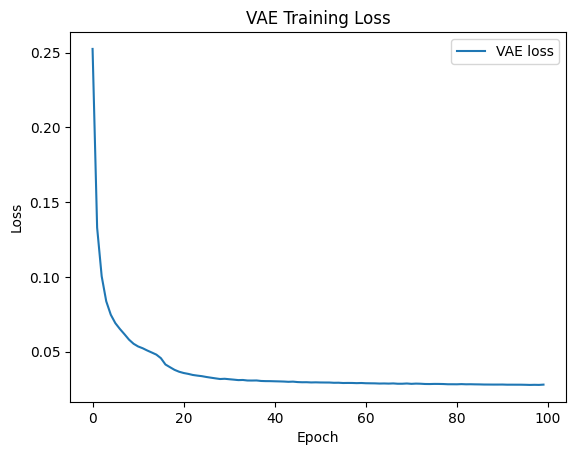

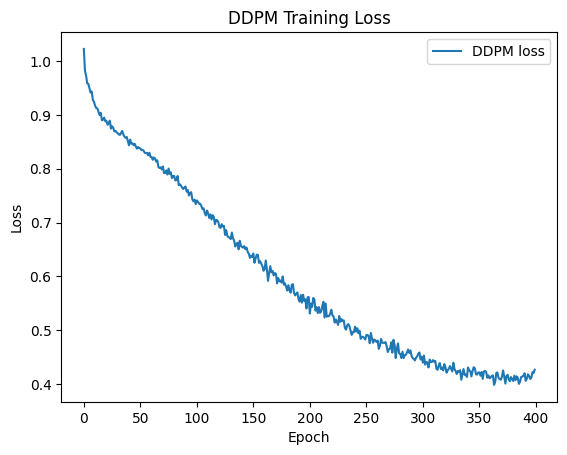

In [38]:
# VAE loss plot
plt.figure()
plt.plot(vae_losses, label="VAE loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("VAE Training Loss")
plt.legend()
plt.show()

# DDPM loss plot
plt.figure()
plt.plot(ddpm_losses, label="DDPM loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("DDPM Training Loss")
plt.legend()
plt.show()

Final sampling from trained DDPM (latent) and decode with VAE:


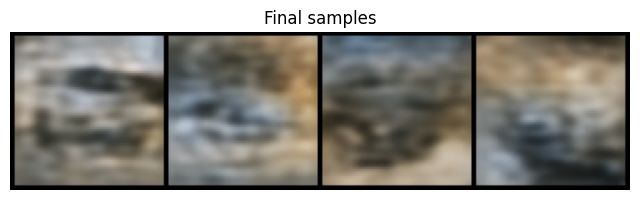

In [81]:

# 3) Final sampling
print("Final sampling from trained DDPM (latent) and decode with VAE:")
sample_latents_and_decode(vae, model, sampler, num_samples=4, sample_steps=100, show_title="Final samples")